###Crear cuaderno e ingerir datos

In [0]:
%sh
rm -r /dbfs/spark_lab 
mkdir /dbfs/spark_lab 
wget -O /dbfs/spark_lab/2019.csv https://raw.githubusercontent.com/MicrosoftLearning/mslearn-databricks/main/data/2019.csv 
wget -O /dbfs/spark_lab/2020.csv https://raw.githubusercontent.com/MicrosoftLearning/mslearn-databricks/main/data/2020.csv 
wget -O /dbfs/spark_lab/2021.csv https://raw.githubusercontent.com/MicrosoftLearning/mslearn-databricks/main/data/2021.csv

--2024-03-27 12:09:39--  https://raw.githubusercontent.com/MicrosoftLearning/mslearn-databricks/main/data/2019.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.108.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 122681 (120K) [text/plain]
Saving to: ‘/dbfs/spark_lab/2019.csv’

     0K .......... .......... .......... .......... .......... 41% 5.50M 0s
    50K .......... .......... .......... .......... .......... 83% 22.1M 0s
   100K .......... .........                                  100% 18.3M=0.01s

2024-03-27 12:09:39 (9.64 MB/s) - ‘/dbfs/spark_lab/2019.csv’ saved [122681/122681]

--2024-03-27 12:09:39--  https://raw.githubusercontent.com/MicrosoftLearning/mslearn-databricks/main/data/2020.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.108.133, 185.199

###Consultar datos en archivos

In [0]:
df = spark.read.load('spark_lab/*.csv', format='csv')
display(df.limit(100))

_c0,_c1,_c2,_c3,_c4,_c5,_c6,_c7,_c8
SO49171,1,2021-01-01,Mariah Foster,mariah21@adventure-works.com,"Road-250 Black, 48",1,2181.5625,174.525
SO49172,1,2021-01-01,Brian Howard,brian23@adventure-works.com,"Road-250 Red, 44",1,2443.35,195.468
SO49173,1,2021-01-01,Linda Alvarez,linda19@adventure-works.com,"Mountain-200 Silver, 38",1,2071.4196,165.7136
SO49174,1,2021-01-01,Gina Hernandez,gina4@adventure-works.com,"Mountain-200 Silver, 42",1,2071.4196,165.7136
SO49178,1,2021-01-01,Beth Ruiz,beth4@adventure-works.com,"Road-550-W Yellow, 44",1,1000.4375,80.035
SO49179,1,2021-01-01,Evan Ward,evan13@adventure-works.com,"Road-550-W Yellow, 38",1,1000.4375,80.035
SO49175,1,2021-01-01,Margaret Guo,margaret24@adventure-works.com,"Road-250 Red, 52",1,2443.35,195.468
SO49180,1,2021-01-01,Mitchell Yuan,mitchell6@adventure-works.com,"Road-650 Black, 58",1,782.99,62.6392
SO49176,1,2021-01-01,Shawn Sharma,shawn11@adventure-works.com,"Mountain-200 Silver, 46",1,2071.4196,165.7136
SO49177,1,2021-01-01,Barbara Chande,barbara44@adventure-works.com,"Mountain-200 Silver, 42",1,2071.4196,165.7136


In [0]:
from pyspark.sql.types import *
from pyspark.sql.functions import *
orderSchema = StructType([
 StructField("SalesOrderNumber", StringType()),
 StructField("SalesOrderLineNumber", IntegerType()),
 StructField("OrderDate", DateType()),
 StructField("CustomerName", StringType()),
 StructField("Email", StringType()),
 StructField("Item", StringType()),
 StructField("Quantity", IntegerType()),
 StructField("UnitPrice", FloatType()),
 StructField("Tax", FloatType())
])
df = spark.read.load('/spark_lab/*.csv', format='csv',
schema=orderSchema)
display(df.limit(100))


SalesOrderNumber,SalesOrderLineNumber,OrderDate,CustomerName,Email,Item,Quantity,UnitPrice,Tax
SO49171,1,2021-01-01,Mariah Foster,mariah21@adventure-works.com,"Road-250 Black, 48",1,2181.5625,174.525
SO49172,1,2021-01-01,Brian Howard,brian23@adventure-works.com,"Road-250 Red, 44",1,2443.35,195.468
SO49173,1,2021-01-01,Linda Alvarez,linda19@adventure-works.com,"Mountain-200 Silver, 38",1,2071.4197,165.7136
SO49174,1,2021-01-01,Gina Hernandez,gina4@adventure-works.com,"Mountain-200 Silver, 42",1,2071.4197,165.7136
SO49178,1,2021-01-01,Beth Ruiz,beth4@adventure-works.com,"Road-550-W Yellow, 44",1,1000.4375,80.035
SO49179,1,2021-01-01,Evan Ward,evan13@adventure-works.com,"Road-550-W Yellow, 38",1,1000.4375,80.035
SO49175,1,2021-01-01,Margaret Guo,margaret24@adventure-works.com,"Road-250 Red, 52",1,2443.35,195.468
SO49180,1,2021-01-01,Mitchell Yuan,mitchell6@adventure-works.com,"Road-650 Black, 58",1,782.99,62.6392
SO49176,1,2021-01-01,Shawn Sharma,shawn11@adventure-works.com,"Mountain-200 Silver, 46",1,2071.4197,165.7136
SO49177,1,2021-01-01,Barbara Chande,barbara44@adventure-works.com,"Mountain-200 Silver, 42",1,2071.4197,165.7136


In [0]:
df.printSchema()

root
 |-- SalesOrderNumber: string (nullable = true)
 |-- SalesOrderLineNumber: integer (nullable = true)
 |-- OrderDate: date (nullable = true)
 |-- CustomerName: string (nullable = true)
 |-- Email: string (nullable = true)
 |-- Item: string (nullable = true)
 |-- Quantity: integer (nullable = true)
 |-- UnitPrice: float (nullable = true)
 |-- Tax: float (nullable = true)



###Filtrar Dataframe

In [0]:
customers = df['CustomerName', 'Email'] #customers=df.select('CustomerName', 'Email')
print(customers.count())
print(customers.distinct().count())
display(customers.distinct())

32718
12427


CustomerName,Email
Ashley Alexander,ashley46@adventure-works.com
Caitlin Brooks,caitlin1@adventure-works.com
Connor Ross,connor0@adventure-works.com
Grant Rai,grant19@adventure-works.com
Meghan Gutierrez,meghan10@adventure-works.com
Ian Alexander,ian59@adventure-works.com
Jennifer Jackson,jennifer40@adventure-works.com
Mya Griffin,mya21@adventure-works.com
Willie Shan,willie29@adventure-works.com
Gregory Becker,gregory24@adventure-works.com


In [0]:
customers = df.select("CustomerName", "Email").where(df["Item"]=='Road-250 Red, 52')
print(customers.count())
print(customers.distinct().count())
display(customers.distinct())

133
133


CustomerName,Email
Bridget Andersen,bridget15@adventure-works.com
Ricky Navarro,ricky10@adventure-works.com
Micah Xu,micah23@adventure-works.com
Bryant Raman,bryant11@adventure-works.com
Roger Wang,roger6@adventure-works.com
Priscilla Yuan,priscilla6@adventure-works.com
Lolan Song,lolan1@adventure-works.com
Margaret Guo,margaret24@adventure-works.com
Richard Baker,richard27@adventure-works.com
Bradley Carson,bradley18@adventure-works.com


###Agregar y agrupar datos en un Dataframe

In [0]:
productSales = df.select("Item", "Quantity").groupBy("Item").sum()
display(productSales)

Item,sum(Quantity)
"Mountain-200 Black, 42",388
"Touring-1000 Yellow, 46",74
"Touring-1000 Blue, 54",67
"Short-Sleeve Classic Jersey, S",216
"Women's Mountain Shorts, S",146
"Long-Sleeve Logo Jersey, L",234
"Mountain-400-W Silver, 42",59
"Racing Socks, M",165
"Mountain-200 Silver, 42",359
"Road-750 Black, 58",170


In [0]:
yearlySales = df.select(year("OrderDate").alias("Year")).groupBy("Year").count().orderBy("Year")
display(yearlySales)

Year,count
2019,1201
2020,2733
2021,28784


###Consultar datos usando Spark SQL

In [0]:
df.createOrReplaceTempView("salesorders")
spark_df = spark.sql("SELECT * FROM salesorders")
display(spark_df)

SalesOrderNumber,SalesOrderLineNumber,OrderDate,CustomerName,Email,Item,Quantity,UnitPrice,Tax
SO49171,1,2021-01-01,Mariah Foster,mariah21@adventure-works.com,"Road-250 Black, 48",1,2181.5625,174.525
SO49172,1,2021-01-01,Brian Howard,brian23@adventure-works.com,"Road-250 Red, 44",1,2443.35,195.468
SO49173,1,2021-01-01,Linda Alvarez,linda19@adventure-works.com,"Mountain-200 Silver, 38",1,2071.4197,165.7136
SO49174,1,2021-01-01,Gina Hernandez,gina4@adventure-works.com,"Mountain-200 Silver, 42",1,2071.4197,165.7136
SO49178,1,2021-01-01,Beth Ruiz,beth4@adventure-works.com,"Road-550-W Yellow, 44",1,1000.4375,80.035
SO49179,1,2021-01-01,Evan Ward,evan13@adventure-works.com,"Road-550-W Yellow, 38",1,1000.4375,80.035
SO49175,1,2021-01-01,Margaret Guo,margaret24@adventure-works.com,"Road-250 Red, 52",1,2443.35,195.468
SO49180,1,2021-01-01,Mitchell Yuan,mitchell6@adventure-works.com,"Road-650 Black, 58",1,782.99,62.6392
SO49176,1,2021-01-01,Shawn Sharma,shawn11@adventure-works.com,"Mountain-200 Silver, 46",1,2071.4197,165.7136
SO49177,1,2021-01-01,Barbara Chande,barbara44@adventure-works.com,"Mountain-200 Silver, 42",1,2071.4197,165.7136


###Ejecutar código SQL en una celda

In [0]:
%sql

SELECT YEAR(OrderDate) AS OrderYear,
 SUM((UnitPrice * Quantity) + Tax) AS GrossRevenue
FROM salesorders
GROUP BY YEAR(OrderDate)
ORDER BY OrderYear;

OrderYear,GrossRevenue
2019,4172169.969970703
2020,6882259.268127441
2021,1.1547835291696548E7


###Visualiza datos con Spark

In [0]:
%sql
SELECT * FROM salesorders

SalesOrderNumber,SalesOrderLineNumber,OrderDate,CustomerName,Email,Item,Quantity,UnitPrice,Tax
SO49171,1,2021-01-01,Mariah Foster,mariah21@adventure-works.com,"Road-250 Black, 48",1,2181.5625,174.525
SO49172,1,2021-01-01,Brian Howard,brian23@adventure-works.com,"Road-250 Red, 44",1,2443.35,195.468
SO49173,1,2021-01-01,Linda Alvarez,linda19@adventure-works.com,"Mountain-200 Silver, 38",1,2071.4197,165.7136
SO49174,1,2021-01-01,Gina Hernandez,gina4@adventure-works.com,"Mountain-200 Silver, 42",1,2071.4197,165.7136
SO49178,1,2021-01-01,Beth Ruiz,beth4@adventure-works.com,"Road-550-W Yellow, 44",1,1000.4375,80.035
SO49179,1,2021-01-01,Evan Ward,evan13@adventure-works.com,"Road-550-W Yellow, 38",1,1000.4375,80.035
SO49175,1,2021-01-01,Margaret Guo,margaret24@adventure-works.com,"Road-250 Red, 52",1,2443.35,195.468
SO49180,1,2021-01-01,Mitchell Yuan,mitchell6@adventure-works.com,"Road-650 Black, 58",1,782.99,62.6392
SO49176,1,2021-01-01,Shawn Sharma,shawn11@adventure-works.com,"Mountain-200 Silver, 46",1,2071.4197,165.7136
SO49177,1,2021-01-01,Barbara Chande,barbara44@adventure-works.com,"Mountain-200 Silver, 42",1,2071.4197,165.7136


Databricks visualization. Run in Databricks to view.

###Comience con matplolib

In [0]:
sqlQuery = "SELECT CAST(YEAR(OrderDate) AS CHAR(4)) AS OrderYear, \
 SUM((UnitPrice * Quantity) + Tax) AS GrossRevenue \
 FROM salesorders \
 GROUP BY CAST(YEAR(OrderDate) AS CHAR(4)) \
 ORDER BY OrderYear"
df_spark = spark.sql(sqlQuery)
df_spark.show()

+---------+--------------------+
|OrderYear|        GrossRevenue|
+---------+--------------------+
|     2019|   4172169.969970703|
|     2020|   6882259.268127441|
|     2021|1.1547835291696548E7|
+---------+--------------------+



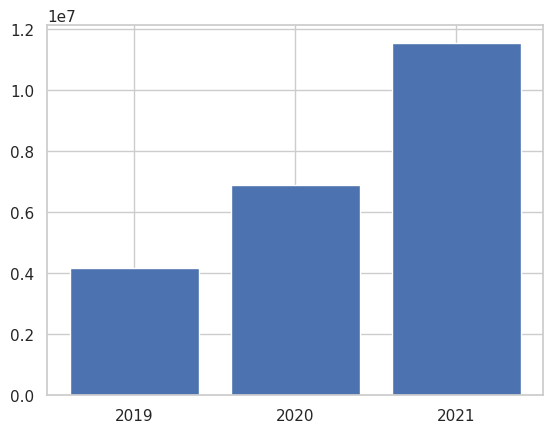

In [0]:
from matplotlib import pyplot as plt

# matplotlib requires a Pandas dataframe, not a Spark one
df_sales = df_spark.toPandas()
# Create a bar plot of revenue by year
plt.bar(x=df_sales['OrderYear'], height=df_sales['GrossRevenue'])
# Display the plot
plt.show()

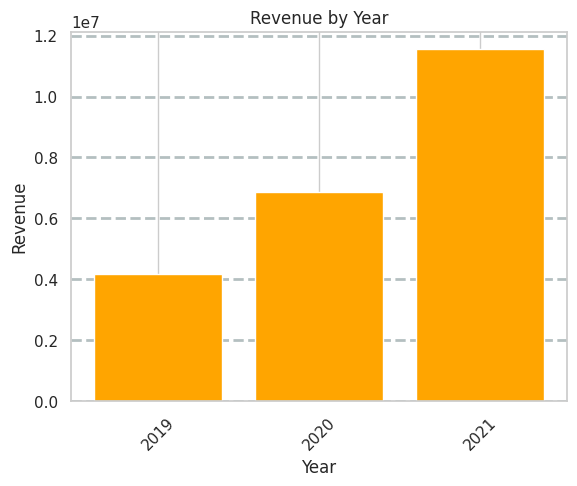

In [0]:
# Clear the plot area
plt.clf()
# Create a bar plot of revenue by year
plt.bar(x=df_sales['OrderYear'], height=df_sales['GrossRevenue'],
color='orange')
# Customize the chart
plt.title('Revenue by Year')
plt.xlabel('Year')
plt.ylabel('Revenue')
plt.grid(color='#95a5a6', linestyle='--', linewidth=2, axis='y',
alpha=0.7)
plt.xticks(rotation=45)
# Show the figure
plt.show()

<Figure size 640x480 with 0 Axes>

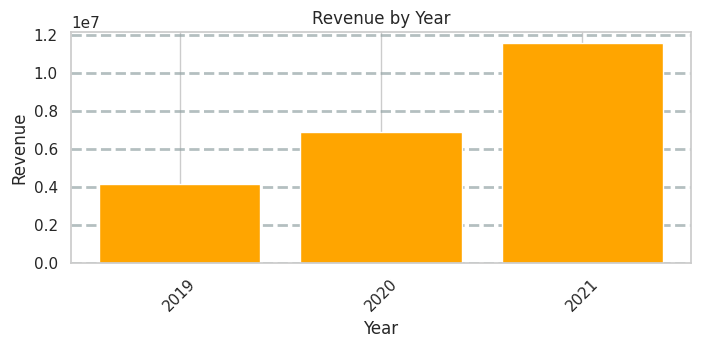

In [0]:
# Clear the plot area
plt.clf()
# Create a Figure
fig = plt.figure(figsize=(8,3))
# Create a bar plot of revenue by year
plt.bar(x=df_sales['OrderYear'], height=df_sales['GrossRevenue'],
color='orange')
# Customize the chart
plt.title('Revenue by Year')
plt.xlabel('Year')
plt.ylabel('Revenue')
plt.grid(color='#95a5a6', linestyle='--', linewidth=2, axis='y',
alpha=0.7)
plt.xticks(rotation=45)
# Show the figure
plt.show()

<Figure size 640x480 with 0 Axes>

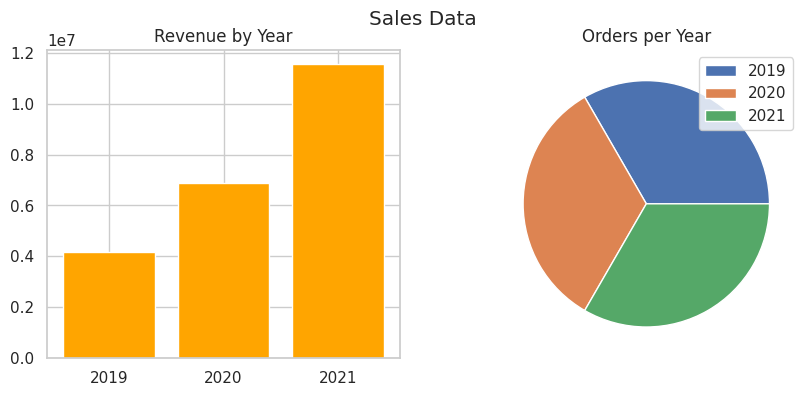

In [0]:
# Clear the plot area
plt.clf()
# Create a figure for 2 subplots (1 row, 2 columns)
fig, ax = plt.subplots(1, 2, figsize = (10,4))
# Create a bar plot of revenue by year on the first axis
ax[0].bar(x=df_sales['OrderYear'], height=df_sales['GrossRevenue'],
color='orange')
ax[0].set_title('Revenue by Year')
# Create a pie chart of yearly order counts on the second axis
yearly_counts = df_sales['OrderYear'].value_counts()
ax[1].pie(yearly_counts)
ax[1].set_title('Orders per Year')
ax[1].legend(yearly_counts.keys().tolist())
# Add a title to the Figure
fig.suptitle('Sales Data')
# Show the figure
plt.show()

###Utilice la biblioteca Seaborn

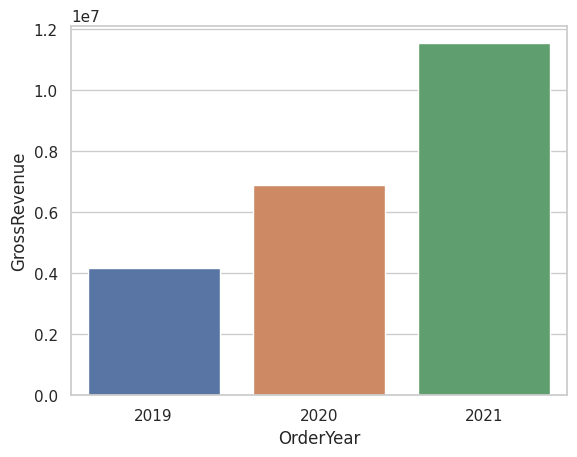

In [0]:
import seaborn as sns

# Clear the plot area
plt.clf()
# Create a bar chart
ax = sns.barplot(x="OrderYear", y="GrossRevenue", data=df_sales)
plt.show()

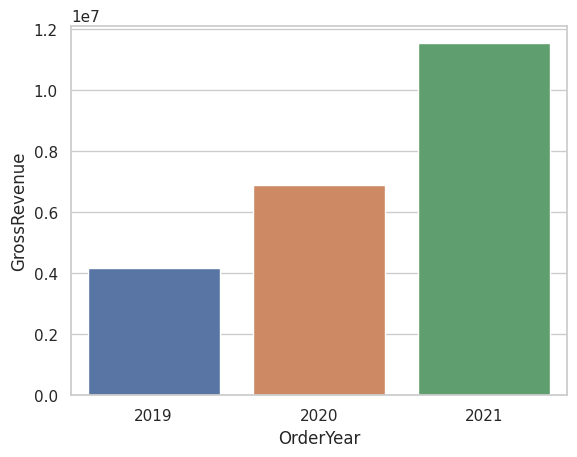

In [0]:
# Clear the plot area
plt.clf()

# Set the visual theme for seaborn
sns.set_theme(style="whitegrid")

# Create a bar chart
ax = sns.barplot(x="OrderYear", y="GrossRevenue", data=df_sales)
plt.show()

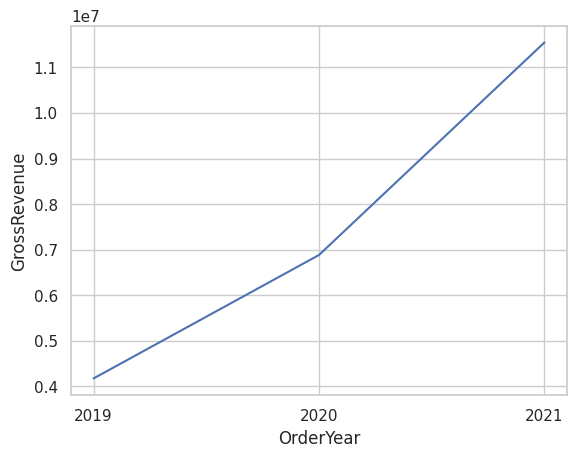

In [0]:
# Clear the plot area
plt.clf()

# Create a bar chart
ax = sns.lineplot(x="OrderYear", y="GrossRevenue", data=df_sales)
plt.show()

###Ejercicios

In [0]:
display(df)

SalesOrderNumber,SalesOrderLineNumber,OrderDate,CustomerName,Email,Item,Quantity,UnitPrice,Tax
SO49171,1,2021-01-01,Mariah Foster,mariah21@adventure-works.com,"Road-250 Black, 48",1,2181.5625,174.525
SO49172,1,2021-01-01,Brian Howard,brian23@adventure-works.com,"Road-250 Red, 44",1,2443.35,195.468
SO49173,1,2021-01-01,Linda Alvarez,linda19@adventure-works.com,"Mountain-200 Silver, 38",1,2071.4197,165.7136
SO49174,1,2021-01-01,Gina Hernandez,gina4@adventure-works.com,"Mountain-200 Silver, 42",1,2071.4197,165.7136
SO49178,1,2021-01-01,Beth Ruiz,beth4@adventure-works.com,"Road-550-W Yellow, 44",1,1000.4375,80.035
SO49179,1,2021-01-01,Evan Ward,evan13@adventure-works.com,"Road-550-W Yellow, 38",1,1000.4375,80.035
SO49175,1,2021-01-01,Margaret Guo,margaret24@adventure-works.com,"Road-250 Red, 52",1,2443.35,195.468
SO49180,1,2021-01-01,Mitchell Yuan,mitchell6@adventure-works.com,"Road-650 Black, 58",1,782.99,62.6392
SO49176,1,2021-01-01,Shawn Sharma,shawn11@adventure-works.com,"Mountain-200 Silver, 46",1,2071.4197,165.7136
SO49177,1,2021-01-01,Barbara Chande,barbara44@adventure-works.com,"Mountain-200 Silver, 42",1,2071.4197,165.7136


In [0]:
df.createOrReplaceTempView("salesorders")
spark_df = spark.sql("SELECT * FROM salesorders")
display(spark_df)

SalesOrderNumber,SalesOrderLineNumber,OrderDate,CustomerName,Email,Item,Quantity,UnitPrice,Tax
SO49171,1,2021-01-01,Mariah Foster,mariah21@adventure-works.com,"Road-250 Black, 48",1,2181.5625,174.525
SO49172,1,2021-01-01,Brian Howard,brian23@adventure-works.com,"Road-250 Red, 44",1,2443.35,195.468
SO49173,1,2021-01-01,Linda Alvarez,linda19@adventure-works.com,"Mountain-200 Silver, 38",1,2071.4197,165.7136
SO49174,1,2021-01-01,Gina Hernandez,gina4@adventure-works.com,"Mountain-200 Silver, 42",1,2071.4197,165.7136
SO49178,1,2021-01-01,Beth Ruiz,beth4@adventure-works.com,"Road-550-W Yellow, 44",1,1000.4375,80.035
SO49179,1,2021-01-01,Evan Ward,evan13@adventure-works.com,"Road-550-W Yellow, 38",1,1000.4375,80.035
SO49175,1,2021-01-01,Margaret Guo,margaret24@adventure-works.com,"Road-250 Red, 52",1,2443.35,195.468
SO49180,1,2021-01-01,Mitchell Yuan,mitchell6@adventure-works.com,"Road-650 Black, 58",1,782.99,62.6392
SO49176,1,2021-01-01,Shawn Sharma,shawn11@adventure-works.com,"Mountain-200 Silver, 46",1,2071.4197,165.7136
SO49177,1,2021-01-01,Barbara Chande,barbara44@adventure-works.com,"Mountain-200 Silver, 42",1,2071.4197,165.7136


#####Parte1

In [0]:
%sql
SELECT CustomerName, SUM(Quantity*UnitPrice) AS Total_Compras
FROM salesorders
GROUP BY CustomerName
LIMIT 10;

CustomerName,Total_Compras
Megan Stewart,5750.9499797821045
Gabriella Sanders,8151.000049591064
Dana Ruiz,3578.27001953125
Jessie Wang,5921.1900091171265
Heidi Sara,1854.578197479248
Isabella Ward,8346.28007888794
Alexandra Harris,4347.760009765625
Vanessa Russell,5898.260009765625
Hailey Cox,3578.27001953125
Brandon Rodriguez,4763.340087890625


#####Parte2

In [0]:
%sql
SELECT Item, SUM(Quantity) AS Total_Quantity
FROM salesorders
GROUP BY Item
LIMIT 1;

Item,Total_Quantity
"Mountain-200 Black, 42",388


In [0]:
cantidadporproducto=df.select("Item","Quantity").groupby("Item").sum()
display(cantidadporproducto)

Item,sum(Quantity)
"Mountain-200 Black, 42",388
"Mountain-100 Silver, 42",42
"Mountain-200 Silver, 42",359
"Mountain-100 Silver, 44",49
"Road-550-W Yellow, 40",156
"Mountain-100 Silver, 38",58
"Road-250 Red, 48",162
"Road-250 Red, 52",133
"Road-650 Red, 52",61
"Road-250 Black, 52",276


#####Parte3

In [0]:
sqlQuery = "SELECT CAST(YEAR(OrderDate) AS CHAR(4)) AS OrderYear, \
 SUM((UnitPrice * Quantity) + Tax) AS GrossRevenue \
 FROM salesorders \
 GROUP BY CAST(YEAR(OrderDate) AS CHAR(4)) \
 ORDER BY OrderYear"
df_spark = spark.sql(sqlQuery)
df_spark.show()

+---------+--------------------+
|OrderYear|        GrossRevenue|
+---------+--------------------+
|     2019|   4172169.969970703|
|     2020|   6882259.268127441|
|     2021|1.1547835291696548E7|
+---------+--------------------+



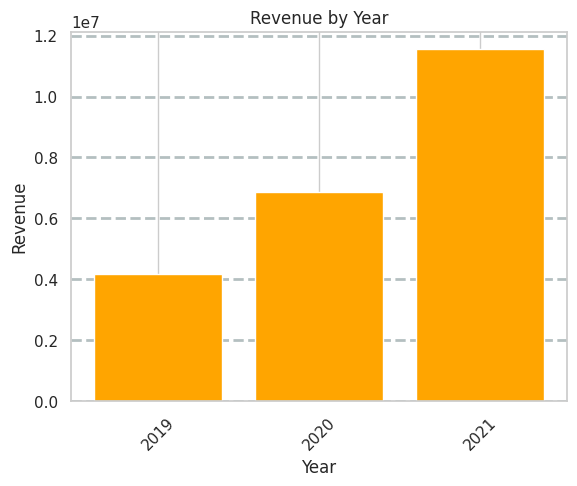

In [0]:
# Clear the plot area
plt.clf()
# Create a bar plot of revenue by year
plt.bar(x=df_sales['OrderYear'], height=df_sales['GrossRevenue'],
color='orange')
# Customize the chart
plt.title('Revenue by Year')
plt.xlabel('Year')
plt.ylabel('Revenue')
plt.grid(color='#95a5a6', linestyle='--', linewidth=2, axis='y',
alpha=0.7)
plt.xticks(rotation=45)
# Show the figure
plt.show()

#####Parte5

In [0]:
%sql
SELECT CustomerName, YEAR(OrderDate) AS OrderYear, SUM(Quantity) AS Total_Quantity
FROM salesorders
WHERE YEAR(OrderDate) = 2021
GROUP BY CustomerName, OrderDate
HAVING SUM(Quantity) >= 1;

CustomerName,OrderYear,Total_Quantity
Edwin Zheng,2021,1
Zoe Bailey,2021,1
Katherine Butler,2021,1
Yolanda Xu,2021,1
Katelyn Brooks,2021,1
Clayton Lin,2021,1
Craig Rubio,2021,1
Riley Butler,2021,1
Noah Coleman,2021,4
Cassie Andersen,2021,2


In [0]:
year_last=df.filter(year("OrderDate")==2021).groupby("CustomerName").count()
inactive_customers=year_last.filter("count=0")
display(inactive_customers)

CustomerName,count
